In [1]:
!pip install scikit-tda[all]

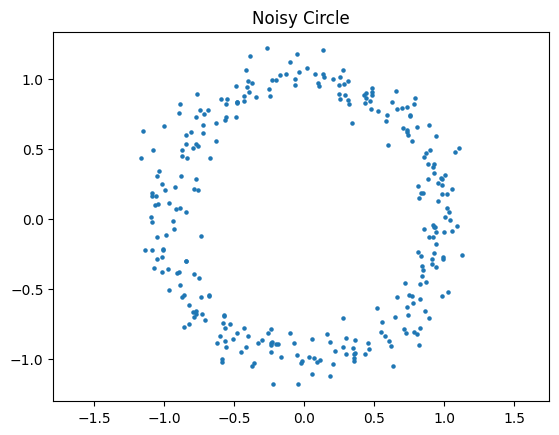

In [2]:
import numpy as np
import matplotlib.pyplot as plt

# Create a noisy circle
n_points = 300
theta = np.linspace(0, 2 * np.pi, n_points)
x = np.cos(theta) + 0.1 * np.random.randn(n_points)
y = np.sin(theta) + 0.1 * np.random.randn(n_points)
points = np.vstack([x, y]).T

plt.scatter(x, y, s=5)
plt.axis('equal')
plt.title("Noisy Circle")
plt.show()


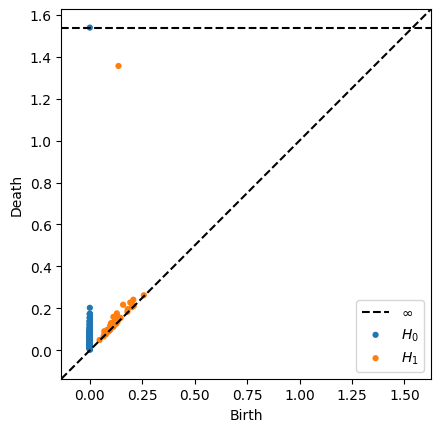

In [3]:
from ripser import ripser
from persim import plot_diagrams

diagrams = ripser(points)['dgms']
plot_diagrams(diagrams, show=True)


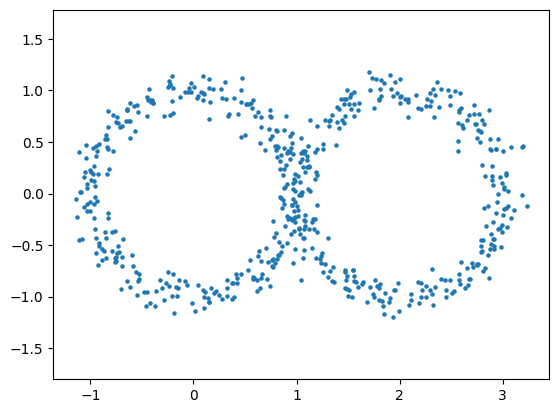

In [4]:
theta = np.linspace(0, 2 * np.pi, n_points)
x1 = np.cos(theta) + 0.1 * np.random.randn(n_points)
y1 = np.sin(theta) + 0.1 * np.random.randn(n_points)

x2 = 2 + np.cos(theta) + 0.1 * np.random.randn(n_points)
y2 = np.sin(theta) + 0.1 * np.random.randn(n_points)

x = np.concatenate([x1, x2])
y = np.concatenate([y1, y2])
points = np.vstack([x, y]).T

plt.scatter(x, y, s=5)
plt.axis('equal')
plt.show()

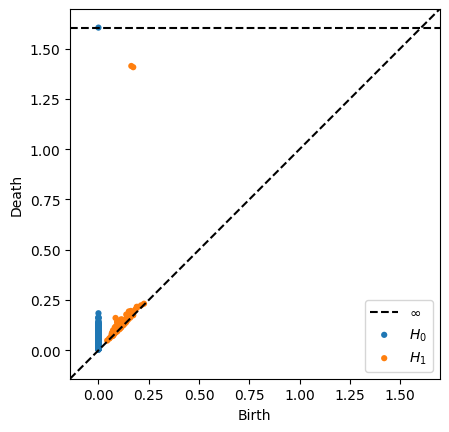

In [5]:
from ripser import ripser
from persim import plot_diagrams

diagrams = ripser(points)['dgms']
plot_diagrams(diagrams, show=True)


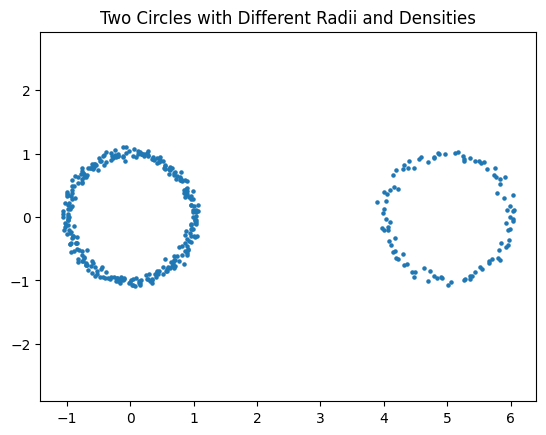

In [6]:
import numpy as np

def generate_two_circles(
    r1=1.0, r2=1.0,           # Radii of circle 1 and 2
    d=2.0,                    # Horizontal distance between circle centers
    n1=300, n2=300,           # Number of points in each circle
    noise=0.1,                # Standard deviation of noise
    seed=None                 # For reproducibility
):
    if seed is not None:
        np.random.seed(seed)

    theta1 = np.linspace(0, 2 * np.pi, n1)
    theta2 = np.linspace(0, 2 * np.pi, n2)

    x1 = r1 * np.cos(theta1) + noise * np.random.randn(n1)
    y1 = r1 * np.sin(theta1) + noise * np.random.randn(n1)

    x2 = d + r2 * np.cos(theta2) + noise * np.random.randn(n2)
    y2 = r2 * np.sin(theta2) + noise * np.random.randn(n2)

    x = np.concatenate([x1, x2])
    y = np.concatenate([y1, y2])
    points = np.vstack([x, y]).T

    return points

import matplotlib.pyplot as plt

points = generate_two_circles(r1=1.0, r2=1.0, d=5, n1=300, n2=100, noise=0.05, seed=42)

plt.scatter(points[:, 0], points[:, 1], s=5)
plt.axis('equal')
plt.title("Two Circles with Different Radii and Densities")
plt.show()


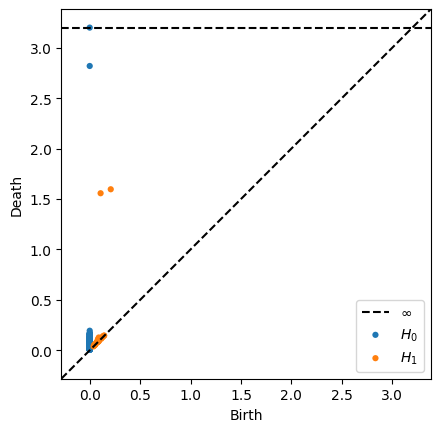

In [7]:
from ripser import ripser
from persim import plot_diagrams

diagrams = ripser(points)['dgms']
plot_diagrams(diagrams, show=True)


In [2]:
import numpy as np

def generate_3d_torus(n_points=1000, R=2.0, r=0.5, noise=0.05, seed=None):
    """
    R: major radius (distance from center to tube center)
    r: minor radius (radius of the tube)
    """
    if seed is not None:
        np.random.seed(seed)

    theta = 2 * np.pi * np.random.rand(n_points)  # around the big circle
    phi = 2 * np.pi * np.random.rand(n_points)    # around the tube

    x = (R + r * np.cos(phi)) * np.cos(theta)
    y = (R + r * np.cos(phi)) * np.sin(theta)
    z = r * np.sin(phi)

    # Add noise
    x += noise * np.random.randn(n_points)
    y += noise * np.random.randn(n_points)
    z += noise * np.random.randn(n_points)

    return np.vstack([x, y, z]).T


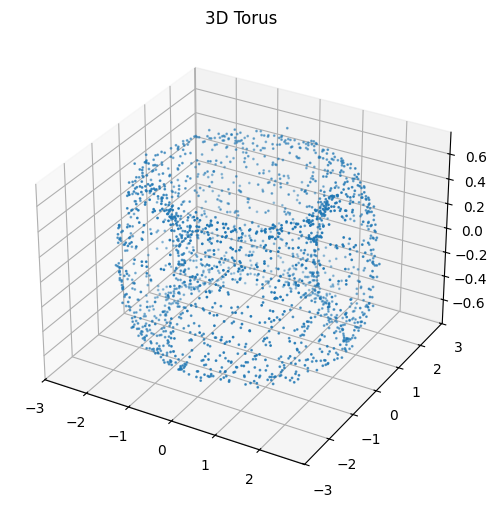

In [3]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt

points = generate_3d_torus(n_points=2000, R=2.0, r=0.6, noise=0.03, seed=42)

fig = plt.figure(figsize=(6,6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(points[:, 0], points[:, 1], points[:, 2], s=1)
ax.set_title("3D Torus")
plt.show()


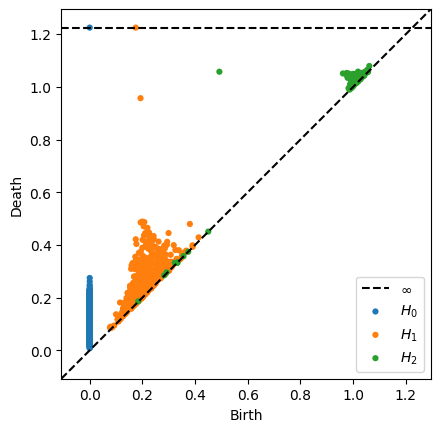

In [4]:
from ripser import ripser
from persim import plot_diagrams

diagrams = ripser(points, maxdim=2, thresh=1.5)['dgms']
plot_diagrams(diagrams, show=True)


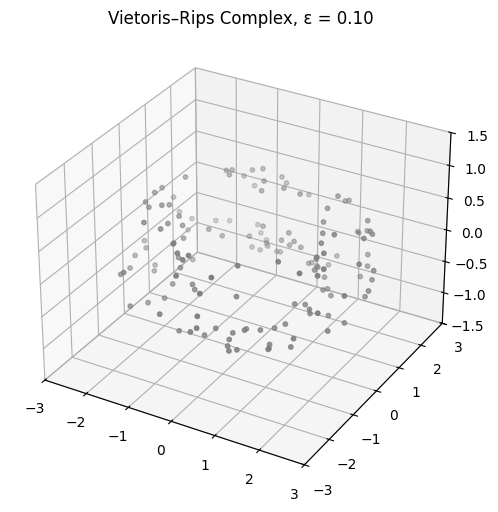

In [11]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from scipy.spatial.distance import pdist, squareform
from mpl_toolkits.mplot3d.art3d import Line3DCollection, Poly3DCollection
from IPython.display import HTML

def generate_3d_torus(n_points=300, R=2.0, r=0.6, noise=0.02, seed=None):
    if seed is not None:
        np.random.seed(seed)
    theta = 2 * np.pi * np.random.rand(n_points)
    phi = 2 * np.pi * np.random.rand(n_points)
    x = (R + r * np.cos(phi)) * np.cos(theta) + noise * np.random.randn(n_points)
    y = (R + r * np.cos(phi)) * np.sin(theta) + noise * np.random.randn(n_points)
    z = r * np.sin(phi) + noise * np.random.randn(n_points)
    return np.vstack([x, y, z]).T

points = generate_3d_torus(n_points=150, seed=42)
D = squareform(pdist(points))

# Helper: find all edges and triangles below epsilon threshold
def build_rips_complex(D, epsilon):
    n = D.shape[0]
    edges = []
    triangles = []
    for i in range(n):
        for j in range(i+1, n):
            if D[i, j] <= epsilon:
                edges.append((i, j))
                for k in range(j+1, n):
                    if D[i, k] <= epsilon and D[j, k] <= epsilon:
                        triangles.append((i, j, k))
    return edges, triangles

# Animation
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

epsilon_values = np.linspace(0.1, 1.2, 60)

def update(frame):
    ax.clear()
    eps = epsilon_values[frame]
    edges, triangles = build_rips_complex(D, eps)

    ax.scatter(points[:, 0], points[:, 1], points[:, 2], color='gray', s=10)

    # Draw edges
    for i, j in edges:
        ax.plot([points[i, 0], points[j, 0]],
                [points[i, 1], points[j, 1]],
                [points[i, 2], points[j, 2]],
                color='blue', linewidth=0.5)

    # Draw triangles
    for i, j, k in triangles:
        verts = [points[i], points[j], points[k]]
        tri = Poly3DCollection([verts], alpha=0.3, color='orange')
        ax.add_collection3d(tri)

    ax.set_xlim(-3, 3)
    ax.set_ylim(-3, 3)
    ax.set_zlim(-1.5, 1.5)
    ax.set_title(f"Vietoris–Rips Complex, ε = {eps:.2f}")

anim = FuncAnimation(fig, update, frames=len(epsilon_values), interval=200)
HTML(anim.to_jshtml())
